## Homework 9

In [72]:
from __future__ import print_function, division
__author__ = "Franz Loza (fhl204), CUSP NYU 2016"

import os
import sys
import numpy as np
import pandas as pd
import json
import geopandas as gp

#plotting packages
import pylab as pl
%pylab inline
#import seaborn
import scipy
from pandas.tools.plotting import scatter_matrix

#stats packages
from scipy.optimize import curve_fit
import scipy.stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import datetime as dt
from IPython.display import Image
from sklearn.cluster import KMeans

from IPython.display import Image
s = json.load( open(os.getenv('PUI2016')+'/fbb_matplotlibrc.json') )
pl.rcParams.update(s)

Populating the interactive namespace from numpy and matplotlib


In [19]:
mtaRides = np.load(os.getenv("PUIDATA")+"/MTA_Fare.npy") #load data

In [20]:
mtaRides.shape #check data shape

(600, 23, 194)

In [11]:
ridetype = np.array(['10t', '14d', '1d', '2t', '30d', '7d', 'ada', 'afas', 'exp','ez',
            'ff','mc','mr','month','rfm','rr','sen','spec','tcmc','t',
            'umlim','xbus','stud'])

In [12]:
#as described in the instruction for some of the analysis 
#one can sum time series for all stations
print (mtaRides.shape)
mta_allsum = np.nansum(mtaRides, axis=0)
print (mta_allsum.shape)
#or for all ride types
mta_allsum = np.nansum(mtaRides, axis=1)
print (mta_allsum.shape)

(600, 23, 194)
(23, 194)
(600, 194)


In [25]:
mtaRides = mtaRides.astype('float') # convert value type to float so that np.nan can work
mtaRides[mtaRides == -1] = np.nan
ridesDate = pd.date_range(start='05/28/2010', end='02/07/2014', freq='W-Fri')

## Task 1 Event detection

(array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.]),
 <a list of 7 Text yticklabel objects>)

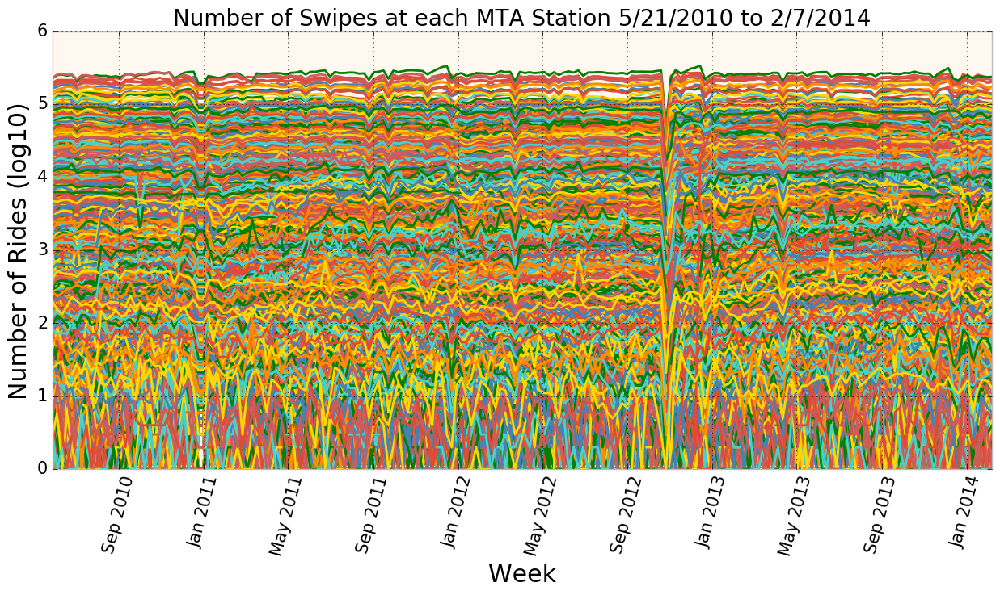

In [51]:
pl.figure(figsize=(15,7))
for i in arange(len(mtaRides)):
    for j in arange(len(mtaRides[i])):
        pl.plot(ridesDate, np.log10(mtaRides[i][j]))
pl.xlabel('Week')
pl.ylabel('Number of Rides (log10)')
pl.title('Number of Swipes at each MTA Station 5/21/2010 to 2/7/2014', fontsize =20)
pl.xticks(rotation=75, fontsize=15)
pl.yticks(fontsize=15)

### Figure 1
Time series of number swipes for each station and ride type from 5/21/10 to 2/21/14.  The most notable dip is between September 2012 and January 2013 signifying a possible anomalous event.

In [41]:
mta_sumbystation = np.nansum(mtaRides, axis=0) # sum up all rides from all stations
averageBystation = np.nanmean(mtaRides, axis=0) # take average of all rides from all stations
mta_sumbycardtype = np.nansum(mtaRides, axis=1)  # sum up all rides from all card types
averageBycardtype = np.nanmean(mtaRides, axis=1) # take average of all rides from all card types
mta_sum = np.nansum(mta_sumbycardtype, axis=0)
mta_sum.shape

(194,)

In [45]:
# Calculate threshold
ridesmean = np.nanmean(mta_sum)
ridesstd = np.nanstd(mta_sum)
thresholds = [ridesmean + 3 * ridesstd, ridesmean - 3 * ridesstd]

In [34]:
print ("average rides: {:}".format(int(ridesmean)))
print ("stdev rides: {:}".format(int(ridesstd)))
print ("3-sigma thresholds {:.2f} {:.2f}".format(*thresholds))
print ("earliest datapoint", min(ridesDate))

average rides: 29781349
stdev rides: 2983960
3-sigma thresholds 38733231.14 20829468.61
earliest datapoint 2010-05-28 00:00:00


In [35]:
indexThresholds = ((mta_sum > thresholds[0]) | (mta_sum < thresholds[1]))
indexbetweenThresholds = ((mta_sum < thresholds[0]) & (mta_sum > thresholds[1]))
ridesDate[indexThresholds]

DatetimeIndex(['2012-10-26'], dtype='datetime64[ns]', freq='W-FRI')

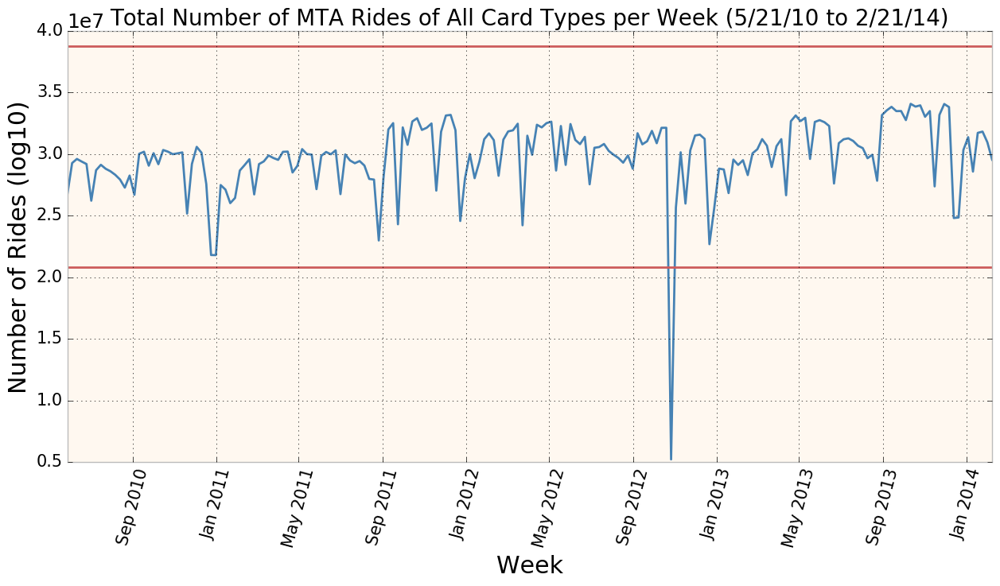

In [50]:
pl.figure(figsize = (15,7))
pl.plot(ridesDate, mta_sum)
pl.axhline(y = ridesmean + 3 * ridesstd, color='indianred', linestyle = '-')
pl.axhline(y = ridesmean - 3 * ridesstd, color='indianred', linestyle = '-')
pl.xlabel('Week')
pl.ylabel('Number of Rides (log10)')
pl.xticks(rotation = 75, fontsize = 15)
pl.yticks(fontsize = 15)
pl.title('Total Number of MTA Rides of All Card Types per Week (5/21/10 to 2/21/14)', fontsize =20)

### Figure 2: 
By summing all the rides at each station and taking the average of all stations then summing all the rides by for each card type and averaging them, we get a more simplified chart above.  Here we see a more pronounced view of the dip between September 2012 and Jan 2013.  To identify th exact date, a 3-sigma threshold was used.  The exact date identified was October 26, 2012 which was when Hurricane Sandy occured.  http://web.mta.info/sandy/timeline.htm

## Task 2 Trends & Stationarity
- Identify the ridership types that have steadily increased in popularity, and that have steadily decreased. 
- By how much? (e.g what is the ratio of usage in the first 10 and last 10 weeks)

A time series is stationary if its MEAN and its VARIANCE are constant globally

In [146]:
df_averagerides = pd.DataFrame()
for i in arange(len(ridetype)):
    df_averagerides[ridetype[i]] = averageBystation[i]
df_averagerides['Date'] = pd.DataFrame(ridesDate)    

In [147]:
print ("10 TRIP CARD Rides\n", 
       df_averagerides['10t'].dropna().head(), "\n", 
       df_averagerides['10t'].dropna().tail())

print ("rolling mean of 10 TRIP CARD Rides\n", 
       pd.rolling_mean(df_averagerides['10t'], 10).dropna().head(), "\n", 
       pd.rolling_mean(df_averagerides['10t'], 10).dropna().tail())

10 TRIP CARD Rides
 0    24880.119048
1    27173.229935
2    27573.708423
3    27329.751620
4    27607.099138
Name: 10t, dtype: float64 
 189    25828.939394
190    28440.173160
191    28548.939394
192    26999.473002
193    26969.582251
Name: 10t, dtype: float64
rolling mean of 10 TRIP CARD Rides
 9     26679.372193
10    26881.506058
11    26810.872935
12    26615.546179
13    26558.988296
Name: 10t, dtype: float64 
 189    27642.301294
190    27587.319258
191    27938.001076
192    27671.185526
193    27298.114440
Name: 10t, dtype: float64


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:6: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:7: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()


/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:13: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).std()


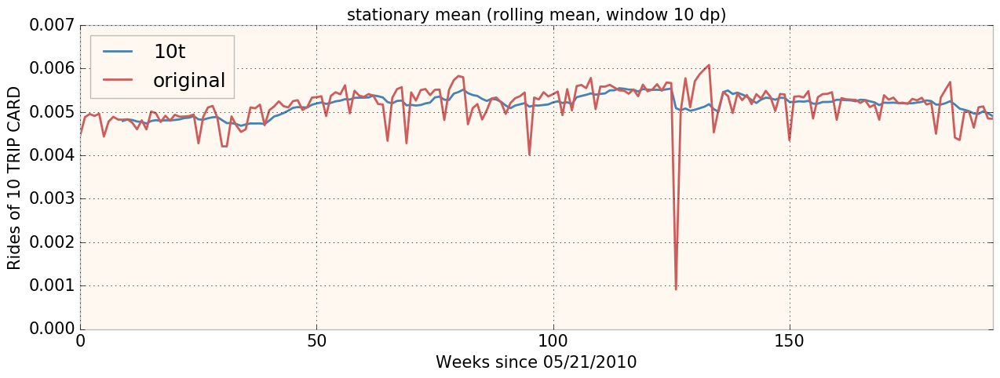

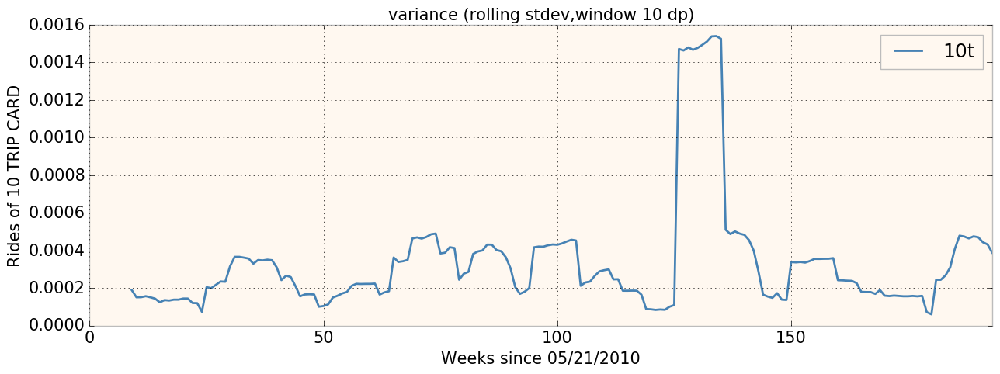

In [151]:
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax = pd.rolling_mean(df_averagerides['10t']/df_averagerides['10t'].sum(), 10).plot(fontsize=20)
ax.set_title("stationary mean (rolling mean, window 10 dp)", fontsize=15)
pl.xlabel("Weeks since 05/21/2010", fontsize=15)
pl.ylabel("Rides of 10 TRIP CARD", fontsize=15)
pl.xticks(fontsize = 15)
pl.yticks(fontsize = 15)
ax.plot(df_averagerides['10t']/df_averagerides['10t'].sum(), label="original")
pl.legend(loc='best')

pl.figure()
ax = pd.rolling_std(df_averagerides['10t']/df_averagerides['10t'].sum(), 10).plot(figsize=(15,5))
ax.set_title("variance (rolling stdev,window 10 dp)", fontsize=15)
pl.xlabel("Weeks since 05/21/2010", fontsize=15)
pl.ylabel("Rides of 10 TRIP CARD", fontsize=15)
pl.xticks(fontsize = 15)
pl.yticks(fontsize = 15)
pl.legend(loc='best')

### Figure 3
Time series of 10 TRIP CARD are stationary with a sharp change due to Hurrican Sandy

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:14: FutureWarning: pd.rolling_std is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).std()


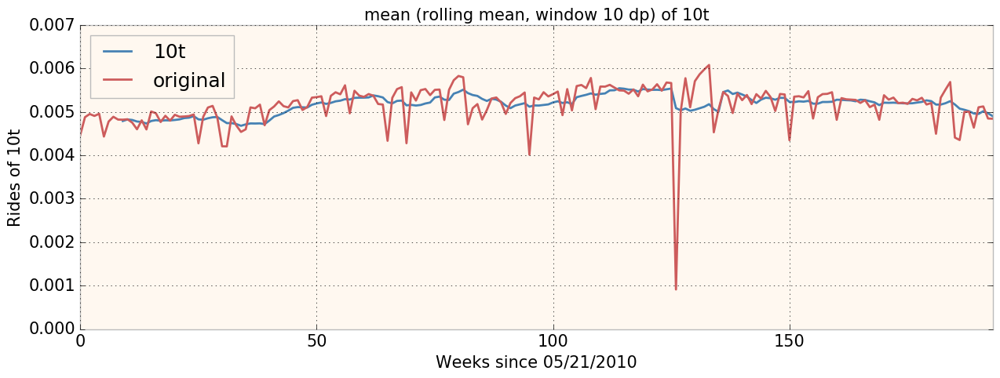

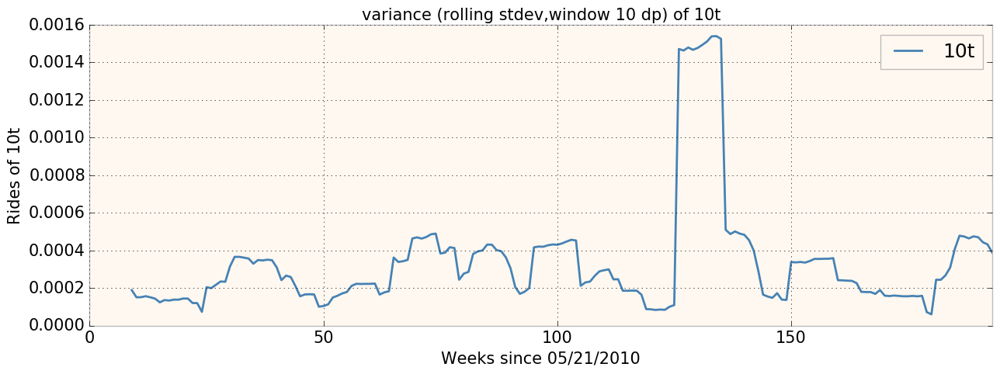

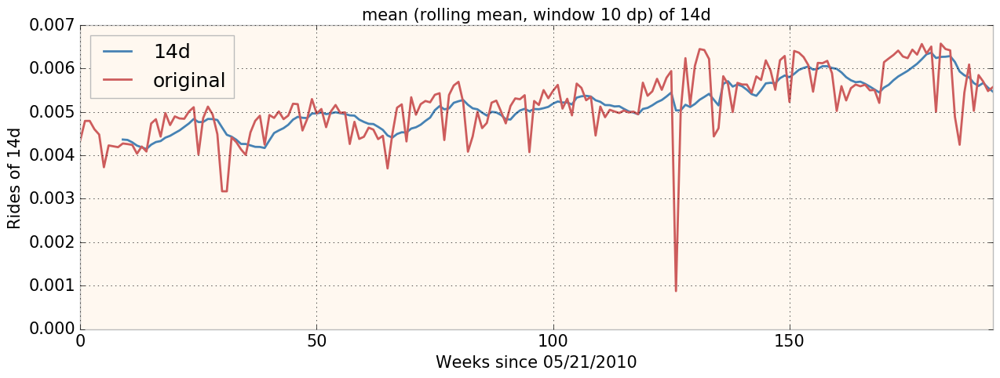

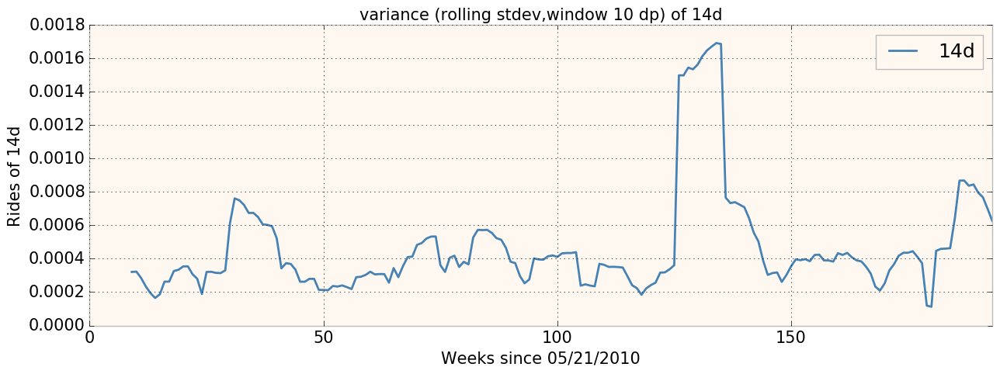

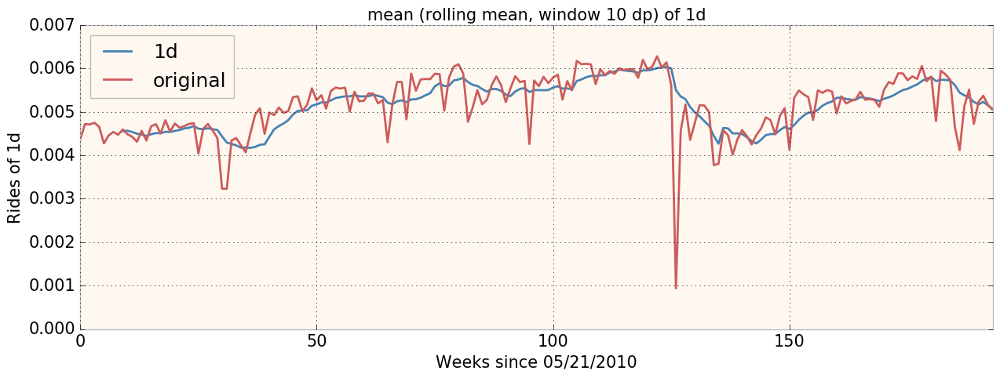

...

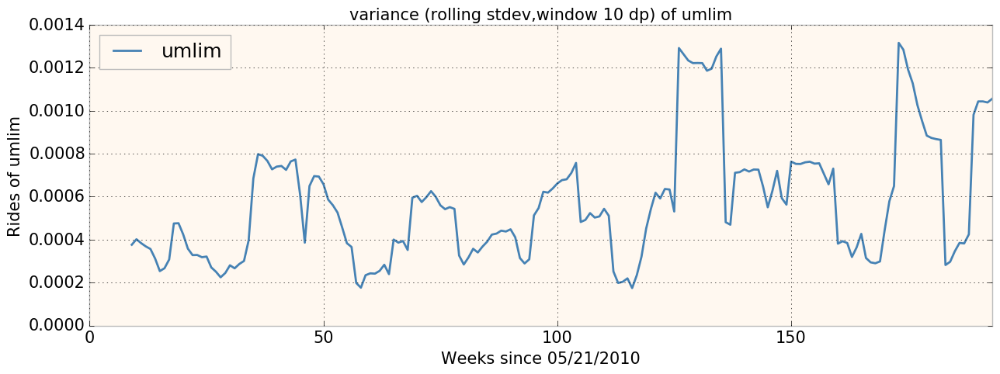

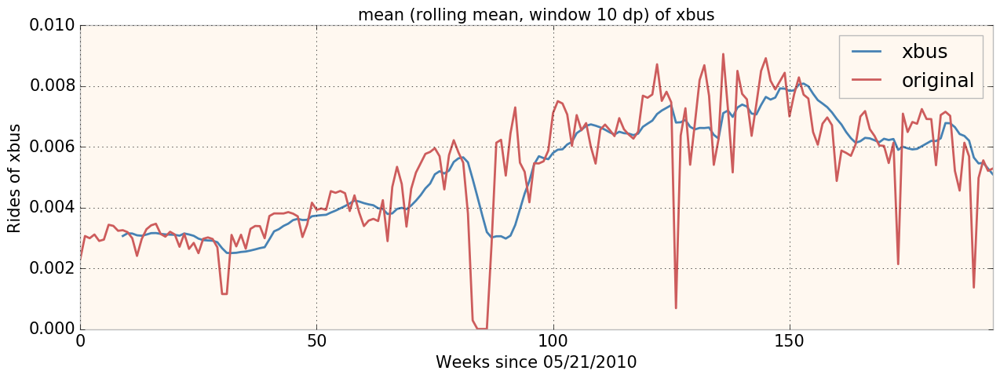

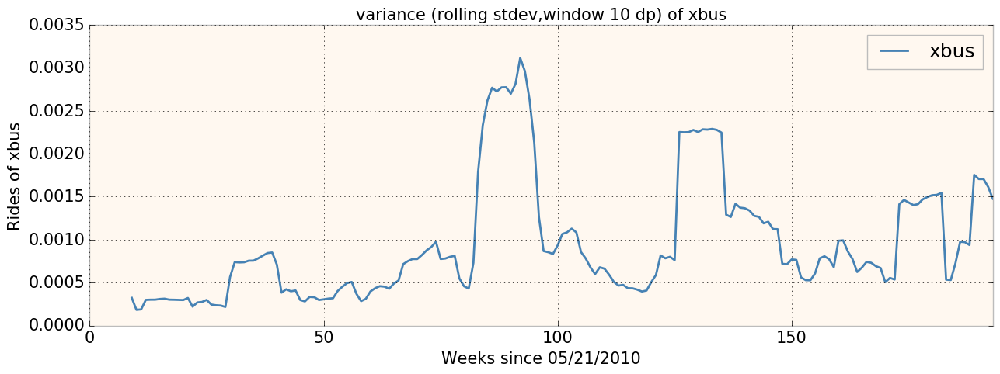

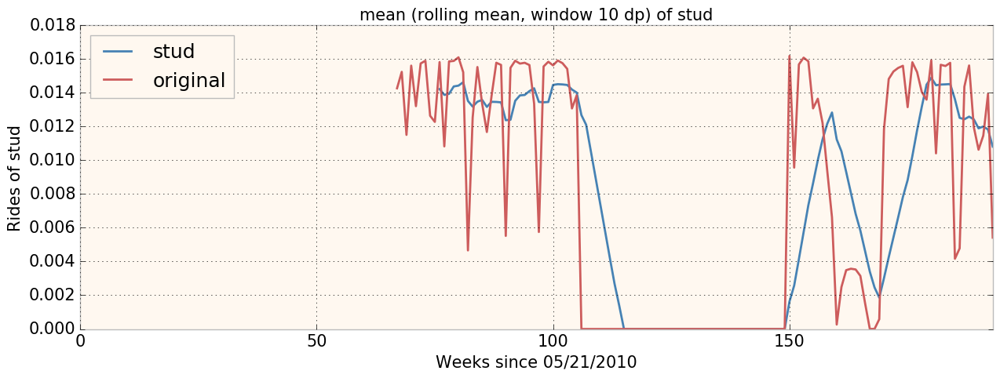

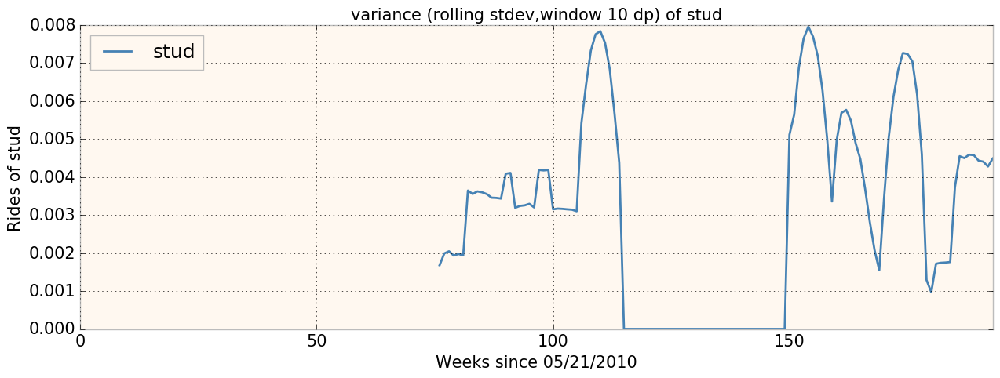

In [178]:
for i in ridetype:
    fig = pl.figure(figsize=(15,5))
    ax = fig.add_subplot(111)
    ax = pd.rolling_mean(df_averagerides[i]/df_averagerides[i].sum(), 10).plot(fontsize=15)
    ax.set_title("mean (rolling mean, window 10 dp) of %s" % i, fontsize=15)
    pl.xlabel("Weeks since 05/21/2010", fontsize=15)
    pl.ylabel(("Rides of %s" % i), fontsize=15)
    pl.xticks(fontsize = 15)
    pl.yticks(fontsize = 15)
    ax.plot(df_averagerides[i]/df_averagerides[i].sum(), label="original")
    pl.legend(loc='best')

    pl.figure()
    ax = pd.rolling_std(df_averagerides[i]/df_averagerides[i].sum(), 10).plot(figsize=(15,5))
    ax.set_title("variance (rolling stdev,window 10 dp) of %s" % i, fontsize=15)
    pl.xlabel("Weeks since 05/21/2010", fontsize=15)
    pl.ylabel(("Rides of %s" % i), fontsize=15)
    pl.xticks(fontsize = 15)
    pl.yticks(fontsize = 15)
    pl.legend(loc='best')

### Figure 4
Plotting trend of all card types in the 194 weeks since 05/21/2010 with rolling mean.  
Steady downward trends evident for: afas, exp, ez, mo and rfm.
Steady increasing trends evident for: 14d, 7d, mr, rr, sen, spec, tcmc, xbus.

In [158]:
for i in ridetype:
    flux = (df_averagerides[i]/df_averagerides[i].sum()).rolling(window=10,center=False).mean()
    fluxRatio = flux[9] / flux[-1:]
    print ("the flux ratio beginning to end of {} is {:.3f}".format(i, float(fluxRatio.values)))

the flux ratio beginning to end of 10t is 0.977
the flux ratio beginning to end of 14d is 0.798
the flux ratio beginning to end of 1d is 0.899
the flux ratio beginning to end of 2t is 1.069
the flux ratio beginning to end of 30d is 0.966
the flux ratio beginning to end of 7d is 0.719
the flux ratio beginning to end of ada is 1.110
the flux ratio beginning to end of afas is 4768.555
the flux ratio beginning to end of exp is 93458.216
the flux ratio beginning to end of ez is 665116.357
the flux ratio beginning to end of ff is 1.220
the flux ratio beginning to end of mc is 0.823
the flux ratio beginning to end of mr is 0.000
the flux ratio beginning to end of month is 1.726
the flux ratio beginning to end of rfm is 1.537
the flux ratio beginning to end of rr is 0.385
the flux ratio beginning to end of sen is 0.343
the flux ratio beginning to end of spec is 0.014
the flux ratio beginning to end of tcmc is 0.652
the flux ratio beginning to end of t is 0.978
the flux ratio beginning to end o

For those with very very big flux ratio we can see from respective graphs that the end of them are nealy zeros. For these types of card, I assume the cancel of services which would not be considered in the trend discovering process.

After all, type 'Sen' and 'rfm' show the sharpest increase and decrease respectively based on flux ratio.

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=3,center=False).mean()


std: 45.339
the flux ratio beginning to end of 327 is 0.343


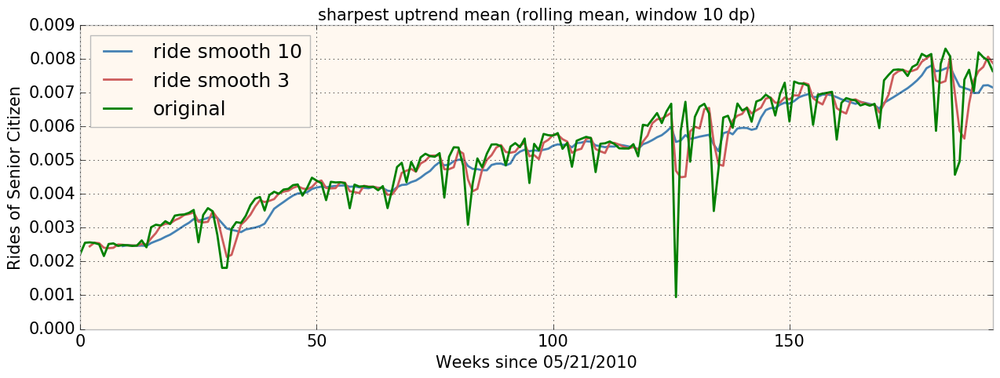

In [171]:
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax = pd.rolling_mean(df_averagerides['sen']/df_averagerides['sen'].sum(), 10).plot(fontsize=15, label='ride smooth 10')
ax = pd.rolling_mean(df_averagerides['sen']/df_averagerides['sen'].sum(), 3).plot(fontsize=15, label='ride smooth 3')
ax.set_title("sharpest uptrend mean (rolling mean, window 10 dp)", fontsize=15)
pl.xlabel("Weeks since 05/21/2010", fontsize=15)
pl.ylabel("Rides of Senior Citizen", fontsize=15)
ax.plot(df_averagerides['sen']/df_averagerides['sen'].sum(), label="original")
pl.legend(loc='best')

flux = (df_averagerides['sen']/df_averagerides['sen'].sum()).rolling(window=10,center=False).mean()
fluxRatio = flux[9] / flux[-1:]
print ("std: {:.3f}".format(df_averagerides['sen'].std()))
print ("the flux ratio beginning to end of {} is {:.3f}".format(i, float(fluxRatio.values)))

### Figure 5
Sharpest uptrend card type is Senior Citizen

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()


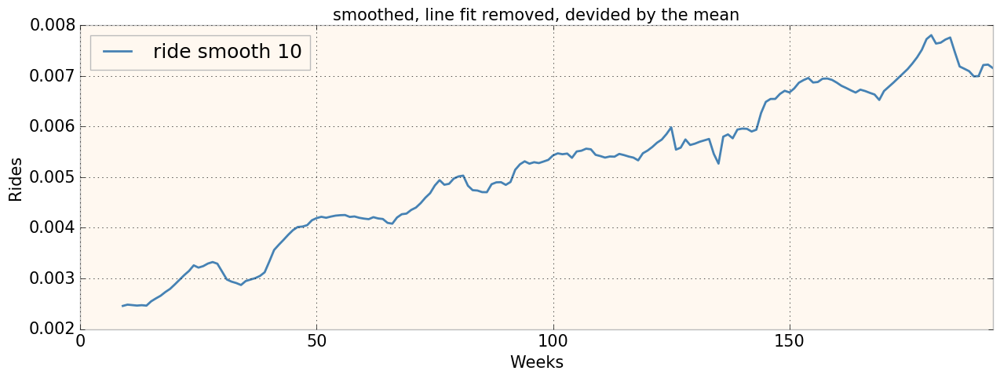

In [173]:
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax = pd.rolling_mean(df_averagerides['sen']/df_averagerides['sen'].sum(), 10).plot(fontsize=15, label='ride smooth 10')

ax.set_title("smoothed, line fit removed, devided by the mean", fontsize=15)
pl.xlabel("Weeks", fontsize=15)
pl.ylabel("Rides", fontsize=15)
pl.legend(loc='best')

### Figure 6
Smoothed line of rides of Senior Citizen Card

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()
/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:4: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=3,center=False).mean()


std: 368.705
the flux ratio beginning to end of 327 is 1.537


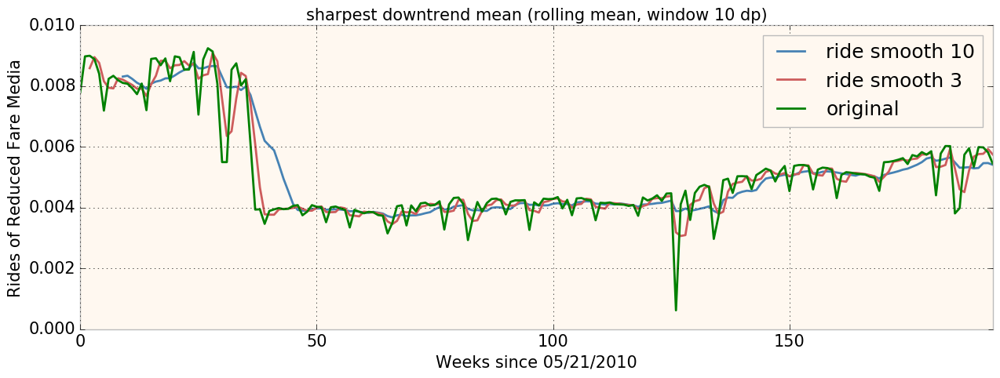

In [175]:
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax = pd.rolling_mean(df_averagerides['rfm']/df_averagerides['rfm'].sum(), 10).plot(fontsize=15, label='ride smooth 10')
ax = pd.rolling_mean(df_averagerides['rfm']/df_averagerides['rfm'].sum(), 3).plot(fontsize=15, label='ride smooth 3')
ax.set_title("sharpest downtrend mean (rolling mean, window 10 dp)", fontsize=15)
pl.xlabel("Weeks since 05/21/2010", fontsize=15)
pl.ylabel("Rides of Reduced Fare Media", fontsize=15)
ax.plot(df_averagerides['rfm']/df_averagerides['rfm'].sum(), label="original")
pl.legend(loc='best')

flux = (df_averagerides['rfm']/df_averagerides['rfm'].sum()).rolling(window=10,center=False).mean()
fluxRatio = flux[9] / flux[-1:]
print ("std: {:.3f}".format(df_averagerides['rfm'].std()))
print ("the flux ratio beginning to end of {} is {:.3f}".format(i, float(fluxRatio.values)))

### Figure 7
Sharpest downtrend card type is Reduced Fare Media

/opt/rh/anaconda/root/envs/PUI2016_Python2/lib/python2.7/site-packages/ipykernel/__main__.py:3: FutureWarning: pd.rolling_mean is deprecated for Series and will be removed in a future version, replace with 
	Series.rolling(window=10,center=False).mean()
  app.launch_new_instance()


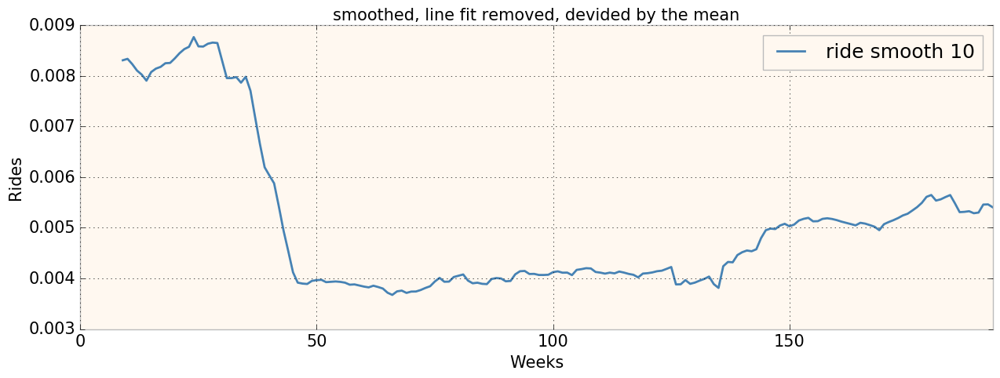

In [176]:
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
ax = pd.rolling_mean(df_averagerides['rfm']/df_averagerides['rfm'].sum(), 10).plot(fontsize=15, label='ride smooth 10')

ax.set_title("smoothed, line fit removed, devided by the mean", fontsize=15)
pl.xlabel("Weeks", fontsize=15)
pl.ylabel("Rides", fontsize=15)
pl.legend(loc='best')

### Figure 8
smoothed line of rides of Reduced Fare Media Card

# Task 3:
Several stations show a prominent annual periodicity. 
- Identify the 4 stations (identify them by the index of their location in the data cube) that show the most prominent periodic trend on an annual period (52 weeks). 
- Figure out what the periodic peak in rides is due to?

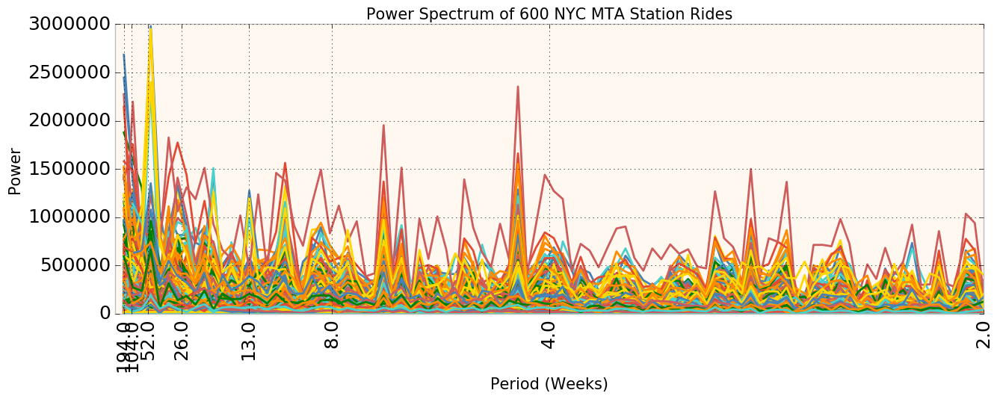

In [181]:
r = len(ridesDate)
allperiods = [1./194, 1./104, 1./52, 1./26, 1./13, 1./8, 1./4, 1./2]

fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
for i in range(len(mta_sumbycardtype)):
    f = np.abs(np.fft.rfft(mta_sumbycardtype[i]))
    ax.plot(np.fft.rfftfreq(r, 1.0)[1:], (f[1:]))
ax.set_xticks(allperiods)
ax.set_xticklabels([ "%s"%(1/f) for f in allperiods], rotation=90)
ax.set_xlabel('Period (Weeks)', fontsize=15)
ax.set_ylabel('Power', fontsize=15)
ax.set_title('Power Spectrum of 600 NYC MTA Station Rides', fontsize=15)

### Figure 9
Fourier Transformation of Rides over 600 NYC MTA Stations.  By looking at the 52 weeks Period, we can see four different colors of peak of wave.

[0, 150, 194, 327]


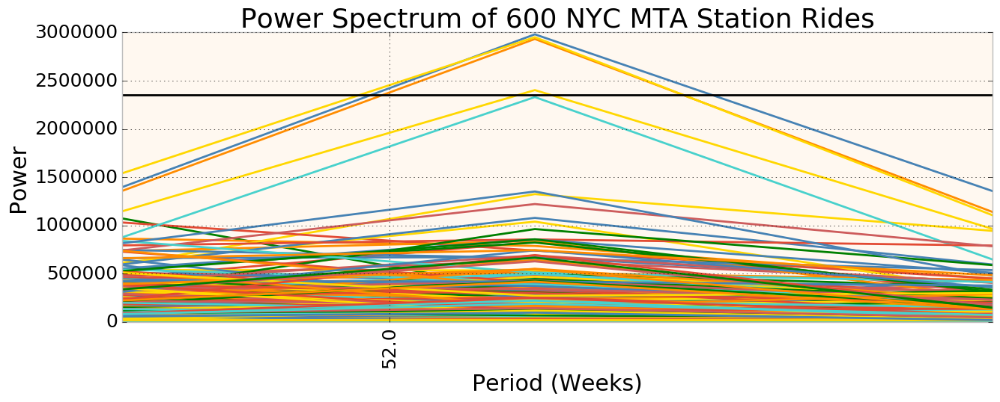

In [184]:
index = []
fig = pl.figure(figsize=(15,5))
ax = fig.add_subplot(111)
for i in range(len(mta_sumbycardtype)):
    f = np.abs(np.fft.rfft(mta_sumbycardtype[i]))
    ax.plot(np.fft.rfftfreq(r, 1.0)[1:], (f[1:]))
    if f[4] > 2.35e6:
        index.append(i)
ax.plot((1./60, 1./40), (2.35e6, 2.35e6), 'k-')
ax.set_xticks(allperiods)
ax.set_xticklabels([ "%s"%(1/x) for x in allperiods], rotation=90)
ax.set_xlim(1./60, 1./40)
ax.set_xlabel('Period (Weeks)')
ax.set_ylabel('Power')
ax.set_title('Power Spectrum of 600 NYC MTA Station Rides')
print (index)

### Figure 10
Zoom in of Figure 9 around period 52 weeks.  We can see the four peaks clearly above the black horizontal line.

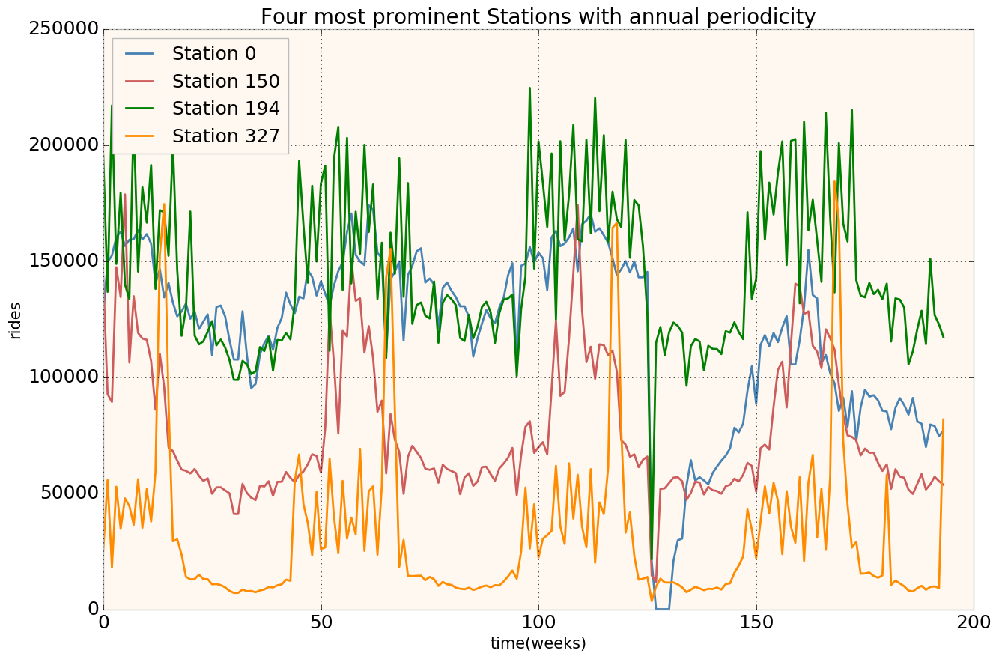

In [170]:
pl.figure(figsize=(15,10))
for i in index:
    pl.plot(mta_sumbycardtype[i], label='Station %s'%i)
pl.xlabel('time(weeks)', fontsize=15)
pl.ylabel('rides', fontsize=15)
pl.title('Four most prominent Stations with annual periodicity', fontsize=20)
pl.legend(loc='best')

### Figure 11
Stations with annual periodicity

## Extra Credit: Clustering Time Series
k-means clustering aims to partition n observations into k clusters in which each observation belongs to the cluster with the nearest mean, serving as a prototype of the cluster. This results in a partitioning of the data space into Voronoi cells.
https://en.wikipedia.org/wiki/K-means_clustering

Methodology: http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

In [110]:
tots = mta_sumbycardtype[mta_sumbycardtype.std(1)>0] #removing empty light curves
vals = ((tots.T - tots.mean(1))/tots.std(1)).T #and standardize the lightcurves before clustering.

### Grouping in 2 clusters

In [128]:
km = KMeans(n_clusters=2, random_state=0).fit(vals) #with Kmeans you have to choose the number of clusters ahead 
kmCluster = km.labels_
kmCluster

array([1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0,
       1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0,

### First Cluster

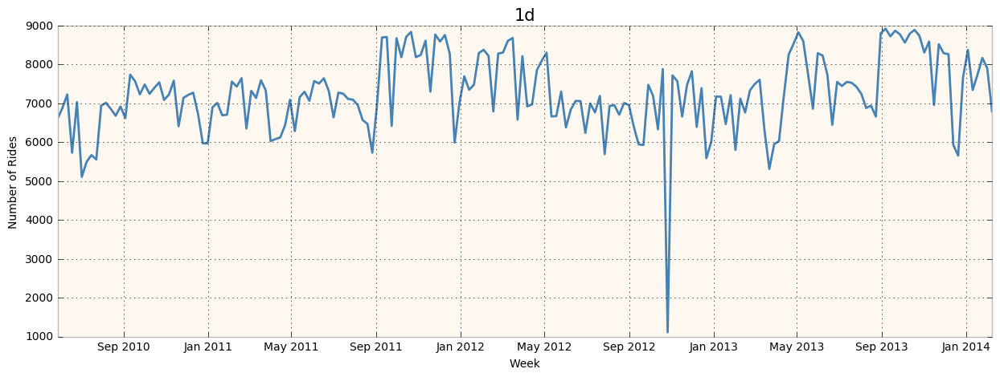

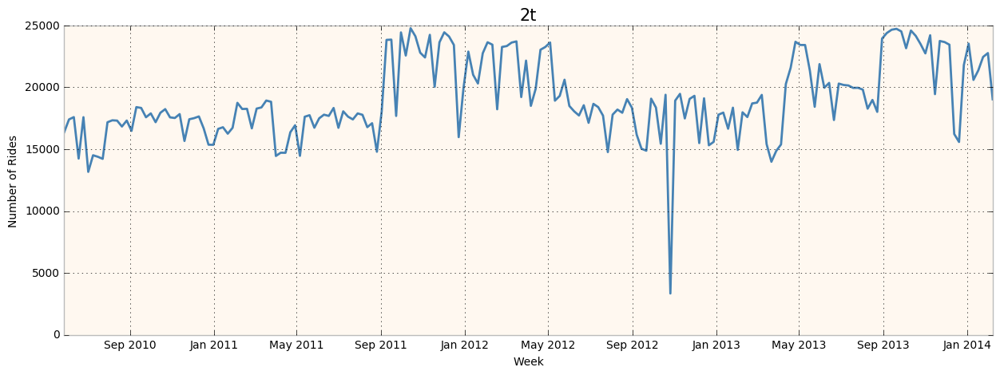

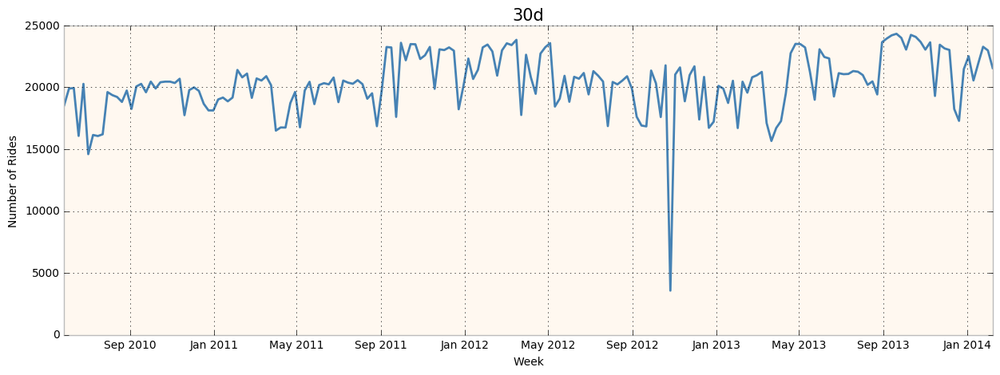

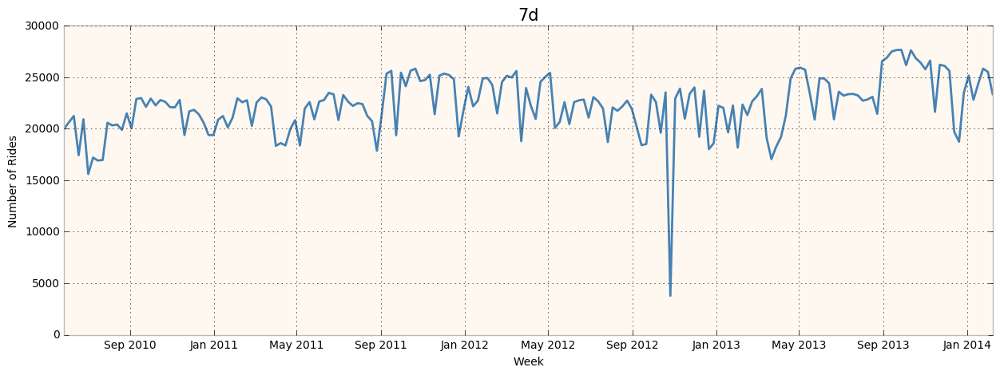

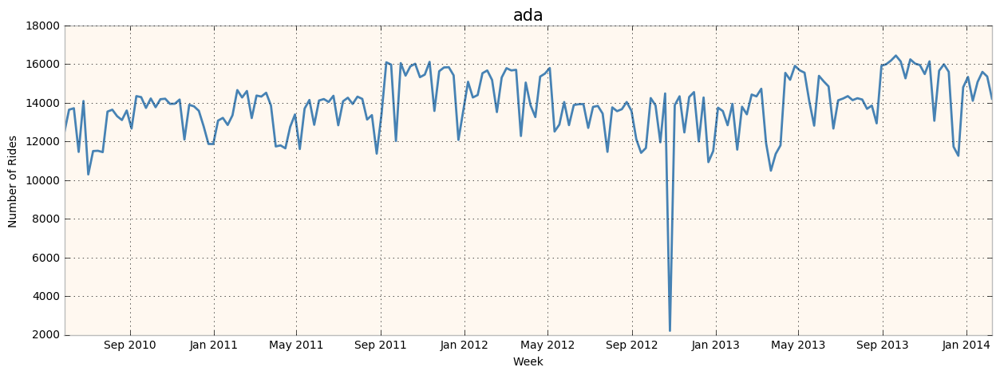

...

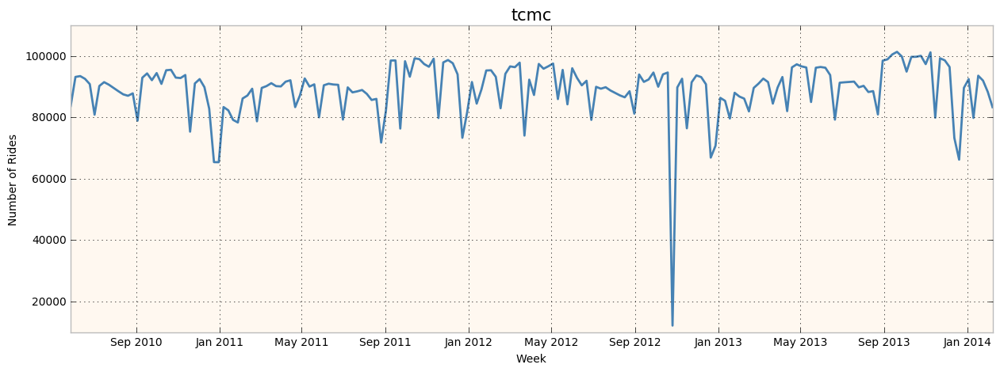

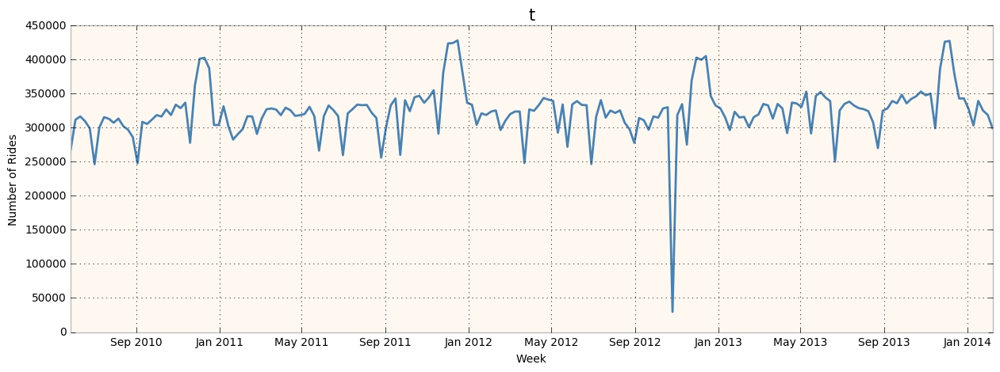

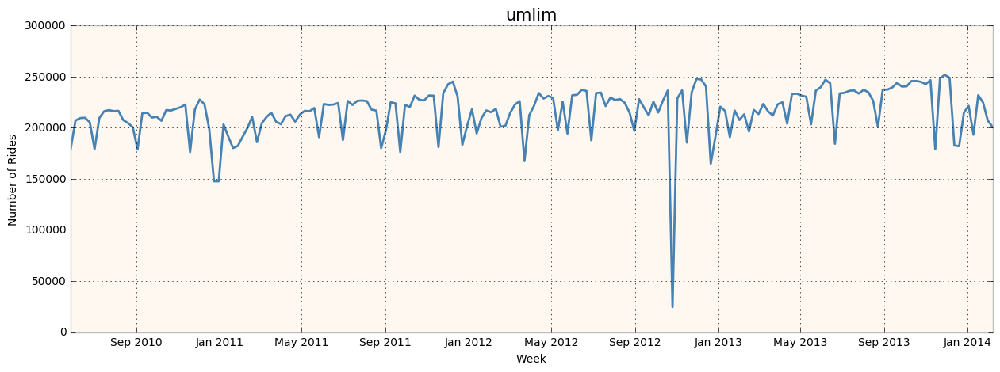

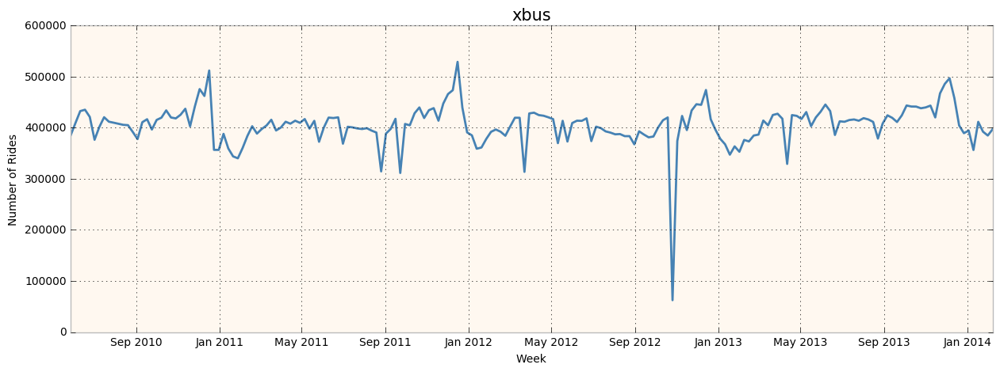

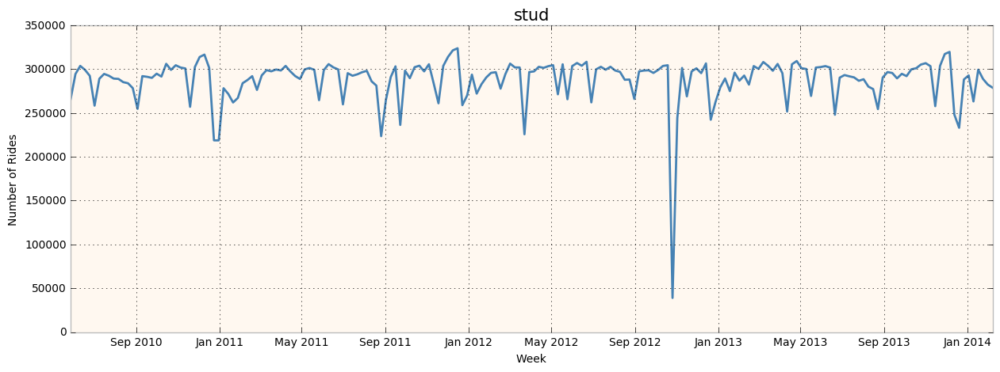

In [135]:
r = len(ridetype)
for i in range(0,r):
    if kmCluster[i]==0:
        pl.figure(figsize=(15,5))
        pl.plot(ridesDate,mta_sumbycardtype[i])
        pl.title(ridetype[i], fontsize=15)
        pl.xlabel('Week', fontsize=10)
        pl.ylabel('Number of Rides', fontsize=10)
        pl.xticks(fontsize=10)
        pl.yticks(fontsize=10)

### Figure 12
When clustered into only two centroids, the first cluster contains 21 card types where the trend is somewhat stationary.

### Second Cluster

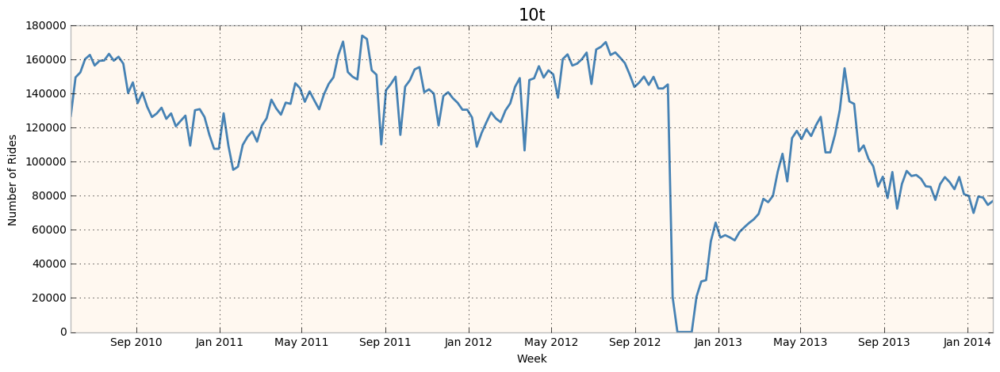

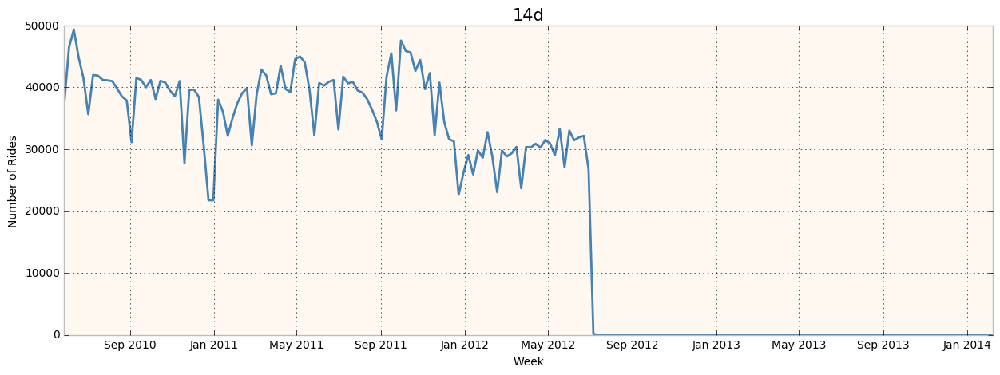

In [136]:
r = len(ridetype)
for i in range(0,r):
    if kmCluster[i]==1:
        pl.figure(figsize=(15,5))
        pl.plot(ridesDate,mta_sumbycardtype[i])
        pl.title(vvvss, fontsize=15)
        pl.xlabel('Week', fontsize=10)
        pl.ylabel('Number of Rides', fontsize=10)
        pl.xticks(fontsize=10)
        pl.yticks(fontsize=10)

### Figure 13
When clustered into only two centroids, the second cluster contains only two card types where the trend shows the card type drops after the hurricane and does not go back up to it's original mean level.  10t appears to go back up till the summer season but then decreases again.  14d appears to just drop all together.